In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import random
import matplotlib.pyplot as plt
import seaborn as sns 
import datetime
import math
import gc
import time


from IPython.display import clear_output

from sklearn.metrics import roc_auc_score

import lightgbm as lgbm

import pickle
def dump_pkl(data, filename):
  with open(filename, 'wb') as handle:
    pickle.dump(data, handle, protocol=pickle.HIGHEST_PROTOCOL)

def load_pkl(filename):
  with open(filename, 'rb') as handle:
    data = pickle.load(handle)
  return data



In [98]:
def get_income_rate(x_start, x_end, y_start, y_end):
    #close_x 
    income_rate_x = x_end / x_start
    #close_y
    income_rate_y = (2*y_start - y_end) / y_start    
    income_rate =  1 + ((income_rate_x - 1) + (income_rate_y - 1))/2
    
    return income_rate

In [7]:
def flag_long(x1, x2, x3, x4, x5):
    if x1 < x2 < x3 < x4 < x5:
        return True
    else:
        return False
    
    
def flag_short(x1, x2, x3, x4, x5):
    if x1 > x2 > x3 > x4 < x5:
        return True
    else:
        return False    


def trend_ma_long(df_cp, Wx=None, wait_hours=None, take_profit=None):
    # Wx < Wy
    df = df_cp.copy()
    df['ration_ma_Wx'] = df['ration'].rolling(window=Wx, min_periods=Wx).mean().values

    inds_run_start = []
    inds_run_end = []
    flag_start = False
    flag_take_profit = False
    for i in range(4, df.shape[0]):
        x1, x2, x3, x4, x5 = df['ration_ma_Wx'].iloc[i-4], df['ration_ma_Wx'].iloc[i-3], df['ration_ma_Wx'].iloc[i-2], df['ration_ma_Wx'].iloc[i-1], df['ration_ma_Wx'].iloc[i]
        
        if (not flag_start) and flag_long(x1, x2, x3, x4, x5):
            inds_run_start += [i]
            flag_start = True

        if flag_start:
            if (1+take_profit)*df['ration_ma_Wx'].iloc[inds_run_start[-1]] < df['ration_ma_Wx'].iloc[i] and not flag_take_profit:
                inds_run_end += [i]
                flag_take_profit = True
            if flag_short(x1, x2, x3, x4, x5):
                flag_start = False
                if not flag_take_profit:
                    inds_run_end += [i]
                flag_take_profit = False

    if len(inds_run_start) > len(inds_run_end):
        inds_run_start = inds_run_start[:-1]
    assert len(inds_run_start) == len(inds_run_end), 'Error len'

    inds_run_start = np.array(inds_run_start)
    inds_run_end = np.array(inds_run_end)
    
    income_rate_x = df.loc[inds_run_end, 'close_x'].values / df.loc[inds_run_start+wait_hours, 'close_x'].values
    #close_y
    income_rate_y = (2*df.loc[inds_run_start+wait_hours, 'close_y'].values - df.loc[inds_run_end, 'close_y'].values) / df.loc[inds_run_start+wait_hours, 'close_y'].values        
    income_rate =  1 + ((income_rate_x - 1) + (income_rate_y - 1))/2
        
    df_res = pd.DataFrame({'ind_start' : inds_run_start,
                          'ind_end' : inds_run_end,
                          'time_start' : df.loc[inds_run_start, 'time'].values,
                          'time_end' : df.loc[inds_run_end, 'time'].values,
                          'delta_time' : df.loc[inds_run_end, 'time'].values - df.loc[inds_run_start, 'time'].values,
                          'x_start' : df.loc[inds_run_start+wait_hours, 'close_x'].values,
                          'x_end' : df.loc[inds_run_end, 'close_x'].values,
                          'y_start' : df.loc[inds_run_start+wait_hours, 'close_y'].values,
                          'y_end' : df.loc[inds_run_end, 'close_y'].values,
                           
                          'income_rate' : income_rate
                          })

            
    return df_res



def multiply(arr):
    res = 1
    for elem in arr:
        res *= elem
    return res


def sum_income_fix_bid(arr):
    return np.sum(arr - 1)

### 1. TON-NEAR

In [406]:
ticker1, ticker2 = 'TON-USDT', 'NEAR-USDT'

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
assert (df1['time'] == df2['time']).all(), 'Error'

df = df1[['time']].copy()
df['close_x'] = df1['close'].copy()
df['close_y'] = df2['close'].copy()
df['ration'] = df['close_x'] / df['close_y']

Wx=30
df['ration_ma_Wx'] = df['ration'].rolling(window=Wx, min_periods=Wx).mean().values

wait_hours = 0
df_res = trend_ma_long(df, Wx=Wx, wait_hours=wait_hours, take_profit=1e6)
df_res.shape

(171, 10)

In [393]:
mask = df_res['delta_time'] > pd.Timedelta(hours=wait_hours)
mask.sum()

171

In [395]:
df_res.loc[mask, 'income_rate'].mean(), sum_income_fix_bid(df_res.loc[mask, 'income_rate'])

(1.0022531748609607, 0.38529290122426707)

### 2. ALL

In [57]:
tickers = ['TON-USDT',
          'NEAR-USDT',
         'BTC-USDT',
         'ETH-USDT',
         'ETC-USDT',
         'XRP-USDT',
         'BNB-USDT',
         'SOL-USDT',
         'DOGE-USDT',
         'ADA-USDT',
         'TRX-USDT',
         'LINK-USDT', 
         'AVAX-USDT', 
         'SUI-USDT',
         'XLM-USDT',
         'LTC-USDT',
         
         'SHIB-USDT',
         'HBAR-USDT',
         'DOT-USDT',
         'BCH-USDT',
         'OP-USDT', 
         
         'AAVE-USDT',
         'LDO-USDT',
         'ARB-USDT',
         'UNI-USDT',
         'ATOM-USDT', #26
         ]

Wxs = [30,  60,  90, 120]

res_tickers = []
res_Wx = []
res_strategy = []
res_mean_ir_2024_3 = []
res_sum_ir_2024_3 = []
res_mean_ir_2024_4 = []
res_sum_ir_2024_4 = []
res_mean_ir_2025 = []
res_sum_ir_2025 = []
count_2025 = []
count_2024_3 = []
count_2024_4 = []

#long
for ticker1 in tqdm(tickers):
    for ticker2 in tickers:
        for Wx in Wxs:
                if ticker1 != ticker2:
                    
                    df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
                    df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
                    assert (df1['time'] == df2['time']).all(), 'Error'

                    #Не самый корректный join для общего случая, но тут корректный
                    df = df1[['time']].copy()
                    df['close_x'] = df1['close'].copy()
                    df['close_y'] = df2['close'].copy()
                    df['ration'] = df['close_x']/df['close_y']
        
                    df_res = trend_ma_long(df, Wx=Wx, wait_hours=0, take_profit=1e6)
    
                    res_tickers += [f"{ticker1}/{ticker2}"]
                    res_Wx += [Wx]
                    res_strategy += ['long']
        
                    mask_2025 = df_res['time_start'] > pd.Timestamp('2025-01-01')   
                    count_2025 += [mask_2025.sum()]
                    res_mean_ir_2025 += [df_res.loc[mask_2025, 'income_rate'].mean() - 1]
                    res_sum_ir_2025 += [sum_income_fix_bid(df_res.loc[mask_2025, 'income_rate'])]

                    mask_2024_3 = (df_res['time_start'] > pd.Timestamp('2024-07-01')) & (pd.Timestamp('2024-10-01') > df_res['time_start'])
                    count_2024_3 += [mask_2024_3.sum()]
                    res_mean_ir_2024_3 += [df_res.loc[mask_2024_3, 'income_rate'].mean() - 1]
                    res_sum_ir_2024_3 += [sum_income_fix_bid(df_res.loc[mask_2024_3, 'income_rate'])]

                    mask_2024_4 = (df_res['time_start'] > pd.Timestamp('2024-10-01')) & (pd.Timestamp('2025-01-01') > df_res['time_start'])
                    count_2024_4 += [mask_2024_4.sum()]
                    res_mean_ir_2024_4 += [df_res.loc[mask_2024_4, 'income_rate'].mean() - 1]
                    res_sum_ir_2024_4 += [sum_income_fix_bid(df_res.loc[mask_2024_4, 'income_rate'])]
                    
                
df_result = pd.DataFrame({'ticker' : res_tickers,
                          'strat' : res_strategy,
                          'Wx' : res_Wx,

                          'c_2024_3' : count_2024_3,
                          'c_2024_4' : count_2024_4,
                          'c_2025' : count_2025,
                          
                          'm_ir_2024_3' : res_mean_ir_2024_3,
                          'm_ir_2024_4' : res_mean_ir_2024_4,
                          'm_ir_2025' : res_mean_ir_2025,
                          
                          's_ir_2024_3' : res_sum_ir_2024_3,
                          's_ir_2024_4' : res_sum_ir_2024_4,
                          's_ir_2025' : res_sum_ir_2025,
                         })

100%|█████████████████████████████████████████████████████████████████████████| 26/26 [06:36<00:00, 15.27s/it]


In [58]:
df_result.shape

(2600, 12)

In [73]:
threshold = 0.2
mask = (df_result['s_ir_2024_3'] > threshold) & (df_result['s_ir_2024_4'] > threshold) & (df_result['s_ir_2025'] > threshold)

pd.set_option('display.max_rows', 100)
df_result[mask].sort_values(by=['ticker', 'Wx'], ascending=False)

,ticker,strat,Wx,c_2024_3,c_2024_4,c_2025,m_ir_2024_3,m_ir_2024_4,m_ir_2025,s_ir_2024_3,s_ir_2024_4,s_ir_2025
500,XRP-USDT/TON-USDT,long,30,36,43,33,0.005858,0.013232,0.006916,0.210873,0.568979,0.228225
576,XRP-USDT/OP-USDT,long,30,21,35,29,0.012495,0.015270,0.012537,0.262393,0.534449,0.363571
587,XRP-USDT/LDO-USDT,long,120,14,11,13,0.018232,0.044051,0.017662,0.255250,0.484557,0.229611
584,XRP-USDT/LDO-USDT,long,30,36,30,29,0.009627,0.011017,0.012295,0.346586,0.330511,0.356548
515,XRP-USDT/ETH-USDT,long,120,20,12,17,0.012277,0.051805,0.021276,0.245539,0.621655,0.361695
514,XRP-USDT/ETH-USDT,long,90,18,15,13,0.012806,0.039913,0.027819,0.230511,0.598700,0.361645
513,XRP-USDT/ETH-USDT,long,60,17,25,23,0.012017,0.028750,0.016135,0.204292,0.718757,0.371111
512,XRP-USDT/ETH-USDT,long,30,28,32,25,0.009002,0.013651,0.009483,0.252050,0.436838,0.237075
571,XRP-USDT/DOT-USDT,long,120,14,17,9,0.014519,0.034497,0.025334,0.203265,0.586449,0.228004
570,XRP-USDT/DOT-USDT,long,90,19,18,11,0.011962,0.024389,0.029202,0.227277,0.439003,0.321221


In [69]:
df_result[mask].shape

(15, 12)

In [15]:
# 576 	XRP-USDT/OP-USDT 	long 	30 	
# 584 	XRP-USDT/LDO-USDT 	long 	30
# 515 	XRP-USDT/ETH-USDT 	long 	120 	
# 569 	XRP-USDT/DOT-USDT 	long 	60 	
# 544 	XRP-USDT/AVAX-USDT 	long 	30
# 589 	XRP-USDT/ARB-USDT 	long 	60
# 1002 	TRX-USDT/TON-USDT 	long 	90 	

In [140]:
def get_income_rate(x_start, x_end, y_start, y_end):
    #close_x 
    income_rate_x = x_end / x_start
    #close_y
    income_rate_y = (2*y_start - y_end) / y_start    
    income_rate =  1 + ((income_rate_x - 1) + (income_rate_y - 1))/2
    
    return income_rate

In [142]:
# 576 	XRP-USDT/OP-USDT 	long 	30 	

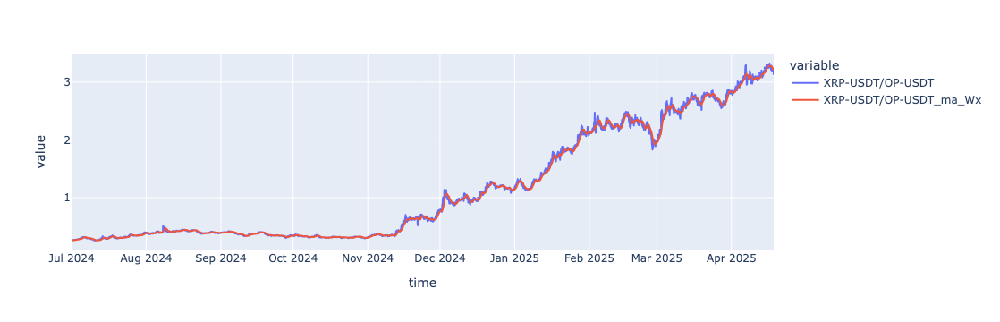

In [381]:
ticker1 = 'XRP-USDT'
ticker2 = 'OP-USDT'
window = 30

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2024-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

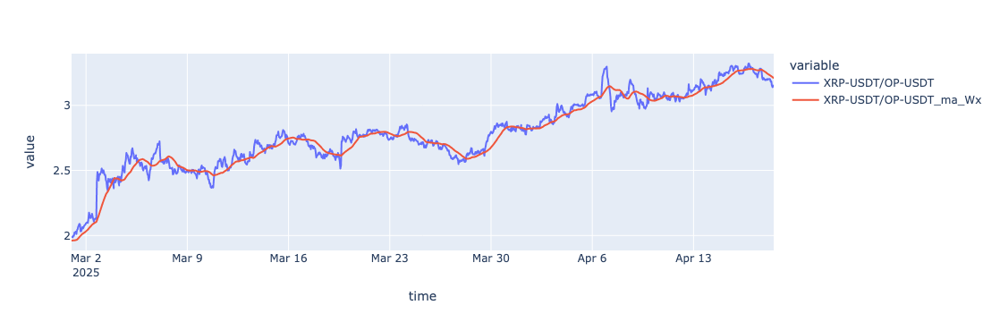

In [386]:
mask = df['time'] >= pd.Timestamp('2025-03-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [ ]:
#+ сигнал, но (?) без отката стремно брать, затестим 1 апреля 18:00. Хотя тут супер долгий тренд и если со стопом

In [335]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

False

In [ ]:
#Статистика: +, +, +

In [102]:
time_start = pd.Timestamp('2025-04-1 10:00:00')
time_end = pd.Timestamp('2025-04-4 10:00:00')

mask_start = df['time'] == time_start
mask_end = df['time'] == time_end

x_start, x_end = df.loc[mask_start, ticker1].iloc[0], df.loc[mask_end, ticker1].iloc[0]
y_start, y_end = df.loc[mask_start, ticker2].iloc[0], df.loc[mask_end, ticker2].iloc[0]

get_income_rate(x_start, x_end, y_start, y_end)

1.026843867966642

In [17]:
# 584 	XRP-USDT/LDO-USDT 	long 	30

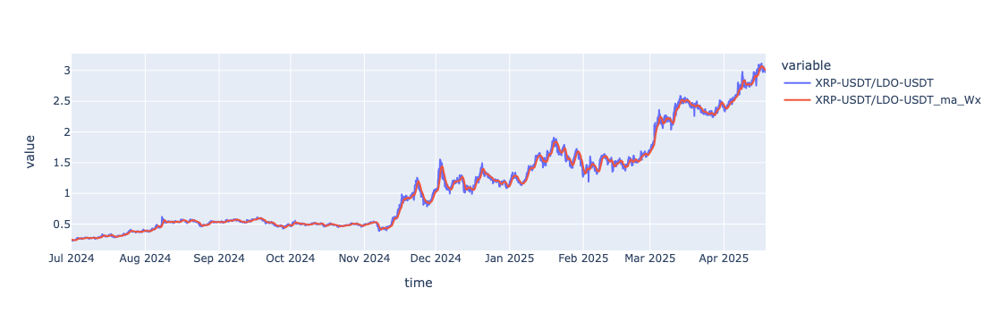

In [388]:
ticker1 = 'XRP-USDT'
ticker2 = 'LDO-USDT'
window = 30

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2024-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

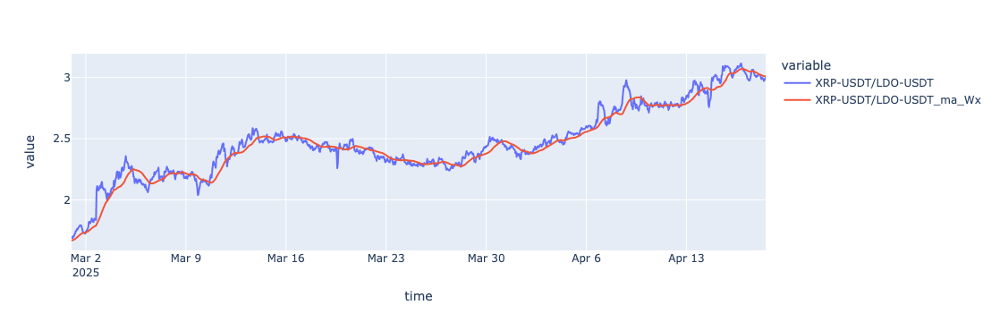

In [392]:
mask = df['time'] >= pd.Timestamp('2025-03-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [347]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

False

In [107]:
#Статистика: +, 

In [194]:
time_start = pd.Timestamp('2025-04-2 17:00:00')
time_end = pd.Timestamp('2025-04-4 6:00:00')

mask_start = df['time'] == time_start
mask_end = df['time'] == time_end

x_start, x_end = df.loc[mask_start, ticker1].iloc[0], df.loc[mask_end, ticker1].iloc[0]
y_start, y_end = df.loc[mask_start, ticker2].iloc[0], df.loc[mask_end, ticker2].iloc[0]

get_income_rate(x_start, x_end, y_start, y_end)

1.00638629728788

In [ ]:
# 515 	XRP-USDT/ETH-USDT 	long 	120 	

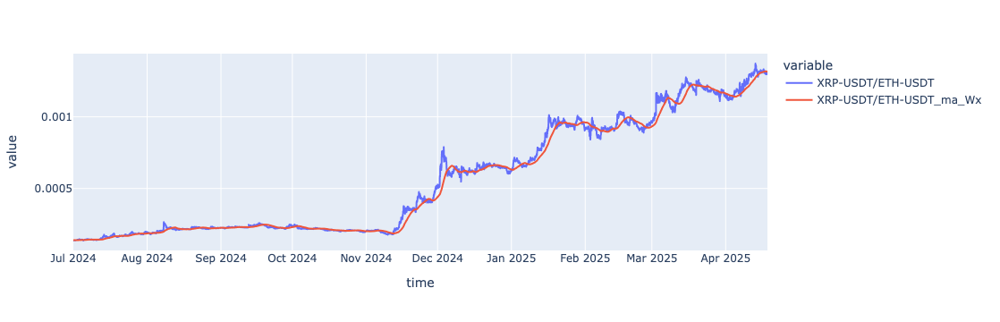

In [394]:
ticker1 = 'XRP-USDT'
ticker2 = 'ETH-USDT'
window = 120

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2024-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

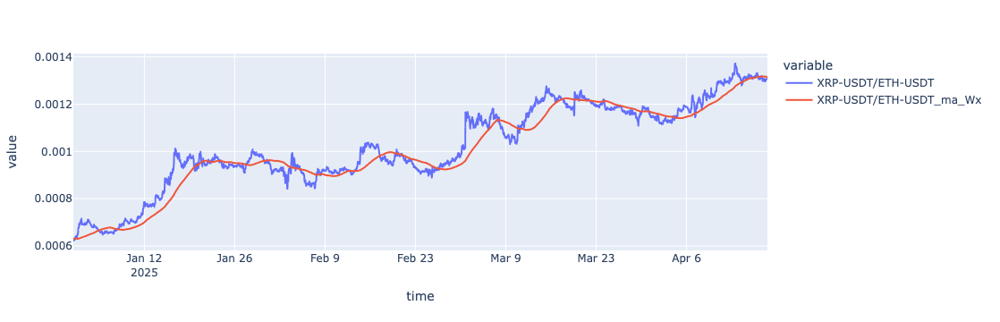

In [396]:
mask = df['time'] >= pd.Timestamp('2025-01-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [353]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

True

In [118]:
# 569 	XRP-USDT/DOT-USDT 	long 	60 	

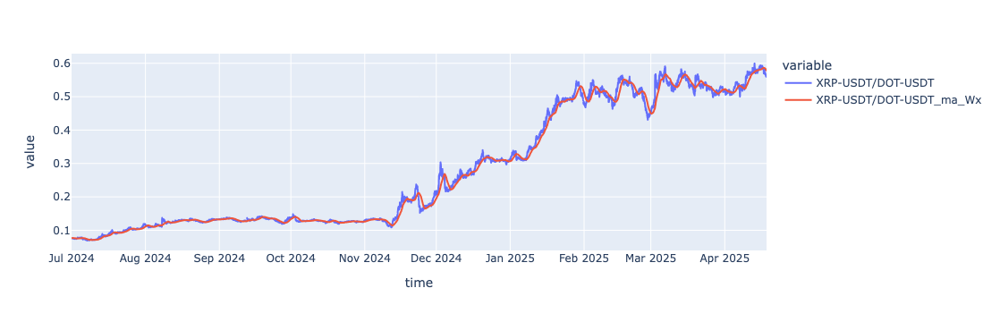

In [398]:
ticker1 = 'XRP-USDT'
ticker2 = 'DOT-USDT'
window = 60

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2024-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

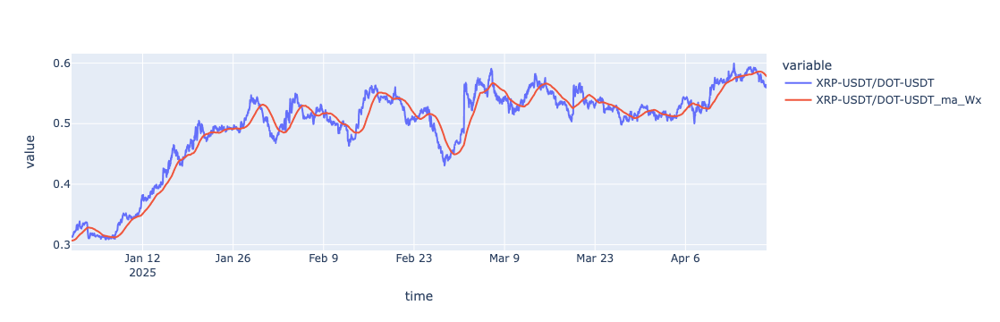

In [400]:
mask = df['time'] >= pd.Timestamp('2025-01-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [244]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

True

In [ ]:
#Статистика: + +

In [127]:
time_start = pd.Timestamp('2025-03-29 10:00:00')
time_end = pd.Timestamp('2025-03-30 10:00:00')

mask_start = df['time'] == time_start
mask_end = df['time'] == time_end

x_start, x_end = df.loc[mask_start, ticker1].iloc[0], df.loc[mask_end, ticker1].iloc[0]
y_start, y_end = df.loc[mask_start, ticker2].iloc[0], df.loc[mask_end, ticker2].iloc[0]

get_income_rate(x_start, x_end, y_start, y_end)

1.0143423778857747

In [129]:
# 544 	XRP-USDT/AVAX-USDT 	long 	30

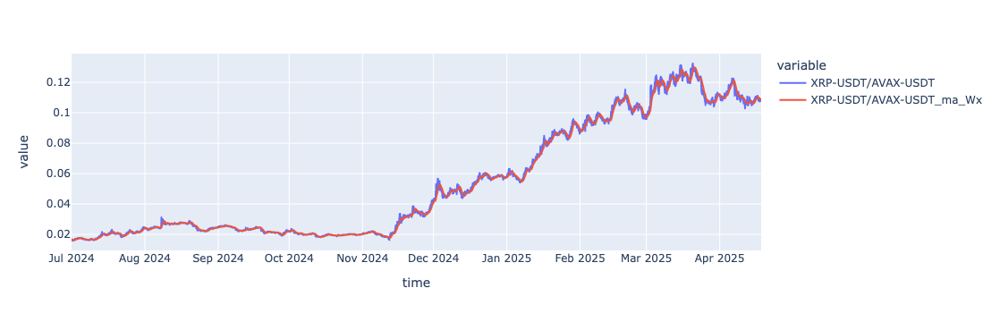

In [402]:
ticker1 = 'XRP-USDT'
ticker2 = 'AVAX-USDT'
window = 30

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2024-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

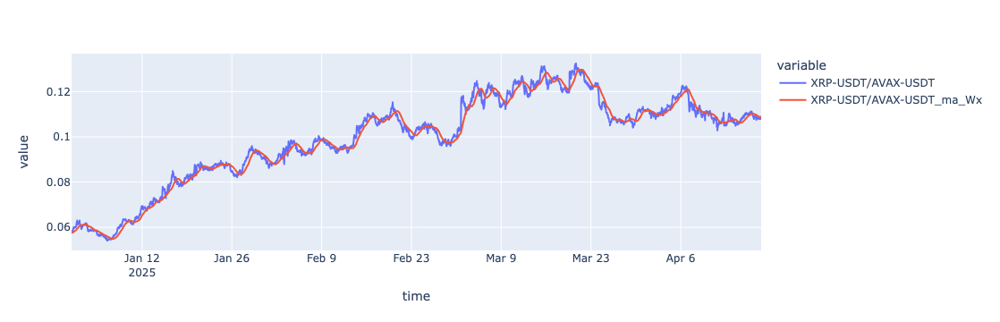

In [404]:
mask = df['time'] >= pd.Timestamp('2025-01-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [369]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

False

In [139]:
#Статистика: +, 

In [44]:
# 589 	XRP-USDT/ARB-USDT 	long 	60

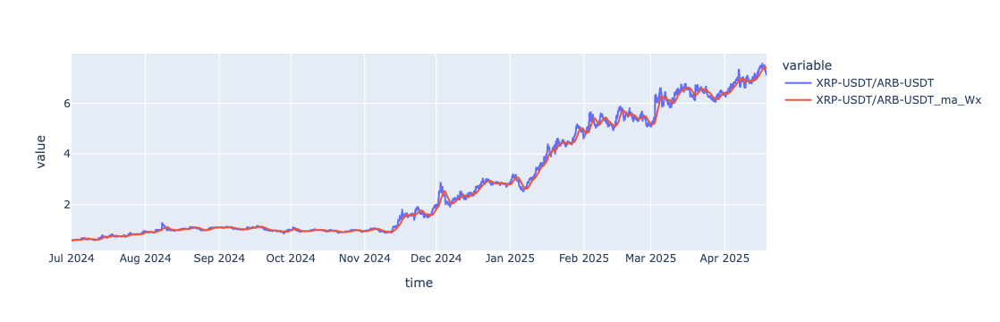

In [406]:
ticker1 = 'XRP-USDT'
ticker2 = 'ARB-USDT'
window = 60

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2024-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

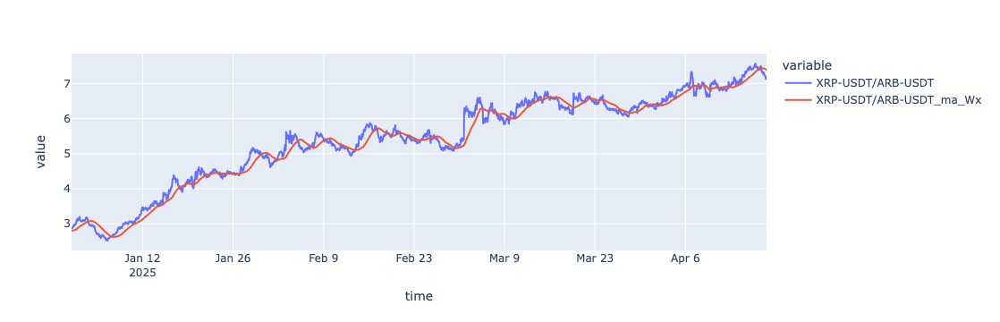

In [408]:
mask = df['time'] >= pd.Timestamp('2025-01-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [375]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

True

In [ ]:
#Статистика: +, 

In [ ]:
# 1002 	TRX-USDT/TON-USDT 	long 	90 	

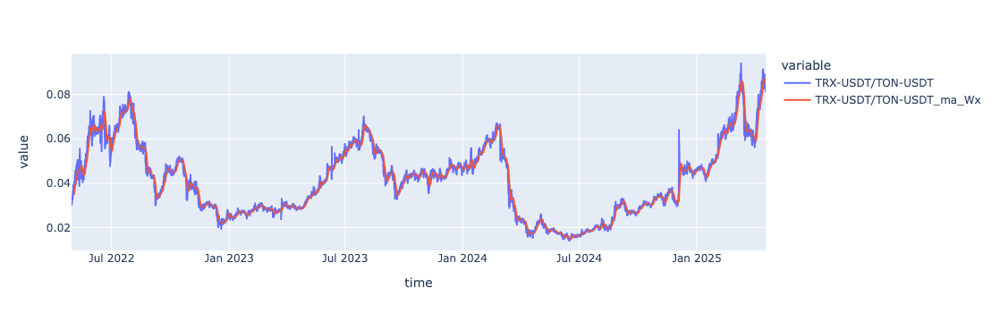

In [410]:
ticker1 = 'TRX-USDT'
ticker2 = 'TON-USDT'
window = 90

df1 = load_pkl(f'./data/raw/1hour/{ticker1}.pkl')
df2 = load_pkl(f'./data/raw/1hour/{ticker2}.pkl')
 
df1[ticker1] = df1['close']
df2[ticker2] = df2['close']

df = df1.merge(df2, on='time', how='inner')[['time', ticker1, ticker2]]

df[f'{ticker1}/{ticker2}'] = df[ticker1]/df[ticker2]


df[f'{ticker1}/{ticker2}_ma_Wx'] = df[f'{ticker1}/{ticker2}'].rolling(window=window, min_periods=window).mean().values


import plotly.express as px

mask = df['time'] >= pd.Timestamp('2020-07-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

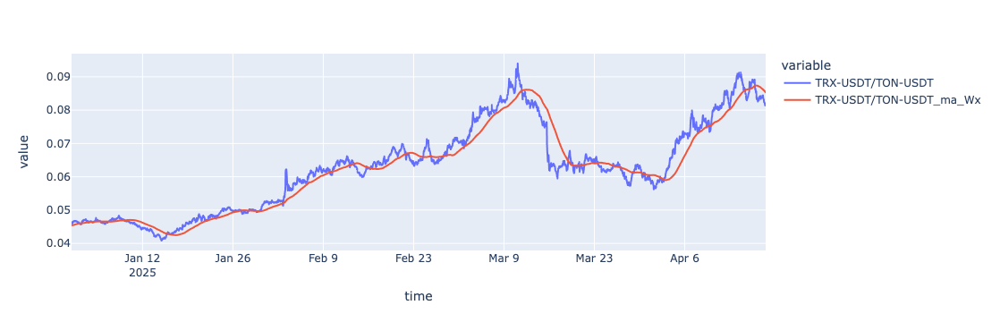

In [412]:
mask = df['time'] >= pd.Timestamp('2025-01-01')
px.line(df.loc[mask, ['time',f'{ticker1}/{ticker2}', f'{ticker1}/{ticker2}_ma_Wx']].set_index('time'))

In [224]:
x1, x2, x3, x4, x5 = df[f'{ticker1}/{ticker2}_ma_Wx'].iloc[-5:].tolist()
flag_long(x1, x2, x3, x4, x5)

True

In [ ]:
#Статистика: 3 апреля +,

In [260]:
time_start = pd.Timestamp('2025-03-3 1:00:00')
time_end = pd.Timestamp('2025-03-9 7:00:00')

mask_start = df['time'] == time_start
mask_end = df['time'] == time_end

x_start, x_end = df.loc[mask_start, ticker1].iloc[0], df.loc[mask_end, ticker1].iloc[0]
y_start, y_end = df.loc[mask_start, ticker2].iloc[0], df.loc[mask_end, ticker2].iloc[0]

get_income_rate(x_start, x_end, y_start, y_end)

1.0819261123655592